<a href="https://colab.research.google.com/github/ingoscargiraldor/ingoscargiraldor/blob/main/Taller2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Exploratory Data Analysis (EDA)
# Oscar Duvan Giraldo Romero
MINE-4101: Applied Data Science  
Univerisdad de los Andes  
  
**Dataset:** Como consultor científico de datos del Banco Mundial, se le ha dado la responsabilidad de
desarrollar análisis que permitan dar respuesta a esta necesidad. Se le ha proporcionado
un dataset construido por la organización Gapminder, quienes han hecho la labor de, a
partir de múltiples fuentes, integrar indicadores por país para un periodo aproximado de
tiempo.

**Business Context:** El Banco Mundial es una organización internacional que se dedica a brindar apoyo
financiero y técnico a países en desarrollo mediante préstamos para proyectos de
infraestructura, sectoriales, institucionales, entre otros, buscando mejorar el bienestar
económico y social de su población. El diseño de políticas de préstamos más informadas y
adaptadas a las necesidades y realidades de cada país, no solo maximiza la probabilidad de
que los préstamos sean reembolsados en su totalidad, sino que también asegura que los
fondos se utilicen de manera efectiva en las necesidades reales del territorio.
Históricamente, el Producto Interno Bruto (PIB) ha sido uno de los indicadores clave para
evaluar la capacidad de pago de un país. Sin embargo, si bien existen reportes anuales del
PIB de los países, aún no se entiende a la perfección con qué otros indicadores como tasa
de empleo, acceso a internet, expectativa de vida, entre otros, se encuentra relacionado.

Last update: August, 2023

Dictionary

•	country: Unique Identifier

•	incomeperperson: 2010 Gross Domestic Product per capita in constant 2000 US$. The inflation but not the differences in the cost of living between countries has been taken into account.

•	alcconsumption: 2008 Alcohol consumption per adult (age 15+), litres Recorded and estimated average alcohol consumption, adult (15+) per capita consumption in litres pure alcohol

•	armedforcesrate: Armed forces personnel (% of the total labour force)

•	breastcancerper100TH: 2002 breast cancer new cases per 100,000 females. Number of new cases of breast cancer in 100,000 female residents during a certain year.

•	co2emissions: 2006 cumulative CO2 emission (metric tons), Total amount of CO2 emission in metric tons since 1751.

•	femaleemployrate: 2007 female employees age 15+ (% of the population). Percentage of female population, age above 15, that has been employed during the given year.

•	HIVrate: 2009 estimated HIV Prevalence % - (Ages 15-49). Estimated number of people living with HIV per 100 population of age group 15-49.

•	Internetuserate: 2010 Internet users (per 100 people). Internet users are people with access to the worldwide network.

•	lifeexpectancy: 2011 life expectancy at birth (years). The average number of years a newborn child would live if current mortality patterns were to stay the same.

•	oilperperson: 2010 oil Consumption per capita (tonnes per year and person).

•	polityscore: 2009 Democracy score (Polity).Overall polity score from the Polity IV dataset, calculated by subtracting an autocracy score from a democracy score. The summary measure of a country's democratic and free nature. -10 is the lowest value, 10 the highest.

•	relectricperperson 2008 residential electricity consumption, per person (kWh). The amount of residential electricity consumption per person during the given year, counted in kilowatt-hours (kWh).

•	suicideper100TH: Suicide, age-adjusted, per 100,000 Mortality due to self-inflicted injury, per 100,000 standard population, age-adjusted.

•	employrate: 2007 total employees age 15+ (% of the population). Percentage of the total p population, age above 15, that has been employed during the given year.

•	urbanrate: Urban population (% of total) Urban population refers to people living in urban areas as defined by national statistical offices (calculated using World Bank population estimates and urban ratios from the United Nations World Urbanization Prospects)


In [2]:
!pip install ydata_profiling

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

from ydata_profiling import ProfileReport

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 357.3/357.3 kB 6.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.7/102.7 kB 9.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 679.5/679.5 kB 12.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 12.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 26.3 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27081 sha256=6d38c07a8d87a0548e1e3fcca31231f42d855533ebf12c259681d8186743dba8
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin


In [3]:
# Pandas configuration for extending the number of columns and rows to show
pd.set_option("display.max_columns", None)
pd.set_option("display.max_rows", 100)

## 1. Loading the data

In [547]:
# Loading the CSV file as dataframe
gapminder_df = pd.read_csv("./data/gapminder_final.csv")

In [548]:
# Showing dataframe dimensions
gapminder_df.shape

(178, 16)

In [549]:
# Showing column types
gapminder_df.dtypes

country                  object
incomeperperson         float64
alcconsumption          float64
armedforcesrate         float64
breastcancerper100th    float64
co2emissions            float64
femaleemployrate        float64
hivrate                 float64
internetuserate         float64
lifeexpectancy          float64
oilperperson            float64
polityscore             float64
relectricperperson      float64
suicideper100th         float64
employrate              float64
urbanrate               float64
dtype: object

In [58]:
gapminder_df.sample(5)

,country,incomeperperson,alcconsumption,armedforcesrate,breastcancerper100th,co2emissions,femaleemployrate,hivrate,internetuserate,lifeexpectancy,oilperperson,polityscore,relectricperperson,suicideper100th,employrate,urbanrate
93,Madagascar,242.677534,1.32,0.235185,19.5,62777000.0,79.199997,0.2,1.699985,66.718,NaN,0.0,NaN,5.767406,83.000000,29.52
142,Cote d'Ivoire,591.067944,6.47,0.233915,26.0,228748666.7,38.099998,3.4,2.599974,55.377,NaN,0.0,70.387444,20.317930,59.900002,48.78
138,Uruguay,9106.327234,8.99,1.579341,83.1,275744333.3,46.000000,0.5,47.867469,77.005,NaN,10.0,823.823197,14.537270,57.500000,92.30
122,Niger,180.083376,0.34,0.217717,23.3,30800000.0,38.000000,0.8,0.829997,54.675,NaN,-3.0,NaN,9.257976,60.400002,16.54
96,Benin,377.039699,2.08,0.223399,28.1,37950000.0,58.200001,1.2,3.129962,56.081,NaN,7.0,38.222943,6.057740,71.599998,41.20


In [504]:
profile = ProfileReport(gapminder_df)

In [505]:
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## 1. Verify data quality

In [506]:
!pip install pylev
import re
from random import randint
from datetime import datetime
from difflib import SequenceMatcher
import numpy as np
import pandas as pd
import pylev

In [550]:
# describing the variable values
gapminder_df["country"].unique()

array(['Ireland', 'Albania', 'Central African Rep.', 'Barbados', 'Italy',
       'Switzerland', 'Mauritania', 'Oman', 'Tanzania', 'Thailand',
       'Haiti', 'Equatorial Guinea', 'Guatemala', 'Iraq', 'Mali',
       'Bolivia', 'Kenya', 'Panama', 'Macedonia, FYR', 'Austria', 'Fiji',
       'Cuba', 'Azerbaijan', 'Korea, Rep.', 'Nicaragua', 'Lithuania',
       'Saudi Arabia', 'Belarus', 'Lesotho', 'Cape Verde', 'Eritrea',
       'Uganda', 'South Africa', 'Gabon', 'Georgia', 'Estonia',
       'Argentina', 'Cambodia', 'Suriname', 'Gambia', 'Japan',
       'Mozambique', 'Norway', 'Angola', 'Yemen, Rep.', 'Armenia',
       'Costa Rica', 'Turkey', 'Moldova', 'Pakistan', 'Vietnam', 'Spain',
       'Syria', 'Uzbekistan', 'Swaziland', 'Croatia', 'Solomon Islands',
       'Ghana', 'Finland', 'Senegal', 'Bangladesh', 'Guyana', 'Ethiopia',
       'Russia', 'Israel', 'Malaysia', 'Kuwait', 'Malta', 'Ecuador',
       'Mongolia', 'Kyrgyzstan', 'Germany', 'Rwanda', 'China', 'Burundi',
       'Slovak Repub

A continuación definimos unas variables para revisar valores duplicados copn la variables features_country y la otra variable features se utilziara para valores nulos,

In [551]:
features_country = ["incomeperperson", "alcconsumption", "armedforcesrate", "breastcancerper100th", "co2emissions", "femaleemployrate", "hivrate", "internetuserate", "lifeexpectancy", "oilperperson", "polityscore", "relectricperperson", "suicideper100th", "employrate", "urbanrate"]
features = ["country", "incomeperperson", "alcconsumption", "armedforcesrate", "breastcancerper100th", "co2emissions", "femaleemployrate", "hivrate", "internetuserate", "lifeexpectancy", "oilperperson", "polityscore", "relectricperperson", "suicideper100th", "employrate", "urbanrate"]

In [552]:
duplicados = gapminder_df.loc[gapminder_df[features_country].duplicated(keep=False)]

In [553]:
duplicados.shape

(24, 16)

In [554]:
duplicados.sort_values(features_country, ascending=True).head(6)

,country,incomeperperson,alcconsumption,armedforcesrate,breastcancerper100th,co2emissions,femaleemployrate,hivrate,internetuserate,lifeexpectancy,oilperperson,polityscore,relectricperperson,suicideper100th,employrate,urbanrate
114,Tajikistan,279.180453,3.39,0.604873,13.2,1.041700e+08,50.099998,0.2,11.549391,67.529,NaN,-3.0,405.775385,2.648981,54.599998,26.46
156,Tajikistan,279.180453,3.39,0.604873,13.2,1.041700e+08,50.099998,0.2,11.549391,67.529,NaN,-3.0,405.775385,2.648981,54.599998,26.46
98,Sudan,523.950151,2.56,0.969499,22.5,2.250197e+08,27.900000,1.1,NaN,61.452,NaN,-4.0,50.892101,9.709556,47.299999,43.44
111,Sudan,523.950151,2.56,0.969499,22.5,2.250197e+08,27.900000,1.1,NaN,61.452,NaN,-4.0,50.892101,9.709556,47.299999,43.44
52,Vietnam,722.807559,3.91,1.085367,16.2,1.425435e+09,67.599998,0.4,27.851822,75.181,NaN,-7.0,302.725655,11.653322,71.000000,27.84
149,Vietnam,722.807559,3.91,1.085367,16.2,1.425435e+09,67.599998,0.4,27.851822,75.181,NaN,-7.0,302.725655,11.653322,71.000000,27.84


Luego de la validación se encuentra que se cuentan con 24 valores duplicados que coinciden en las 16 caracteristicas, a continuación se procede a imputar estos valores mediante la función drop_cuplicates

In [555]:
gapminder_df = gapminder_df.drop_duplicates(subset=features_country)

In [556]:
duplicados = gapminder_df.loc[gapminder_df[features_country].duplicated(keep=False)]

In [557]:
duplicados.shape

(0, 16)

In [558]:
gapminder_df.shape

(166, 16)

Luego de la eliminación de duplicados se cuenta con un dataset de 166 filas manteninedo las 16 caracteristicas.

In [559]:
gapminder_df["incomeperperson"].describe(percentiles=[.25, .5, .75, .95, .99])

count      163.000000
mean      7202.019107
std      10469.295971
min        103.775857
25%        602.502870
50%       2344.896916
75%       8550.031767
95%      32116.462386
99%      39561.370946
max      52301.587180
Name: incomeperperson, dtype: float64

In [560]:
gapminder_no_outliers_df = gapminder_df.loc[gapminder_df["incomeperperson"] <= gapminder_df["incomeperperson"].quantile(.9)]

In [561]:
gapminder_no_outliers_df.shape

(146, 16)

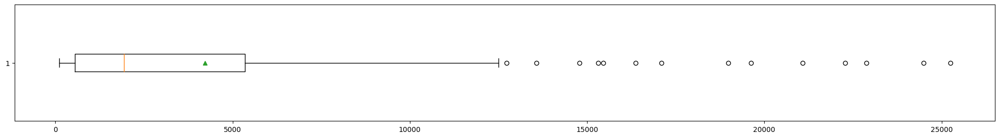

In [562]:
plt.figure(figsize=(25, 3))
plt.boxplot(gapminder_no_outliers_df["incomeperperson"], showmeans=True, vert=False)
plt.show()

In [563]:
gapminder_no_outliers_df[features].isnull().sum() / gapminder_no_outliers_df.shape[0]

country                 0.000000
incomeperperson         0.000000
alcconsumption          0.000000
armedforcesrate         0.027397
breastcancerper100th    0.006849
co2emissions            0.013699
femaleemployrate        0.006849
hivrate                 0.136986
internetuserate         0.013699
lifeexpectancy          0.000000
oilperperson            0.691781
polityscore             0.054795
relectricperperson      0.239726
suicideper100th         0.000000
employrate              0.006849
urbanrate               0.000000
dtype: float64

De acuerdo al conocimiento que me la operación anterior con el porcentaje de valores vacios se deciden escoger algunas cracateristicas que se piensan son importantes para el modelo y que no tengan tanto impacto en la falta de parametros sobre el dataset.

In [564]:
features_top5 = ["alcconsumption", "breastcancerper100th", "lifeexpectancy", "internetuserate", "urbanrate"]

In [565]:
duplicados_top5 = gapminder_no_outliers_df.loc[gapminder_no_outliers_df[features_top5].duplicated(keep=False)]

In [567]:
duplicados_top5.shape

(0, 16)

In [568]:
gapminder_no_outliers_df = gapminder_no_outliers_df.dropna(subset=["incomeperperson"]+features_top5)

In [569]:
gapminder_no_outliers_df.shape

(143, 16)

In [570]:
gapminder_no_outliers_df[["incomeperperson"]+features_top5].isnull().sum() / gapminder_no_outliers_df.shape[0]

incomeperperson         0.0
alcconsumption          0.0
breastcancerper100th    0.0
lifeexpectancy          0.0
internetuserate         0.0
urbanrate               0.0
dtype: float64

Analisis Univariado alcconsumption

In [571]:
gapminder_no_outliers_df["alcconsumption"].describe(percentiles=[.25, .5, .75, .95, .99])

count    143.000000
mean       6.469441
std        5.017776
min        0.050000
25%        2.470000
50%        5.560000
75%        9.445000
95%       16.293000
99%       19.024000
max       23.010000
Name: alcconsumption, dtype: float64

In [572]:
gapminder_no_outliers_df = gapminder_no_outliers_df.loc[gapminder_no_outliers_df["alcconsumption"] <= gapminder_no_outliers_df["alcconsumption"].quantile(.9)]

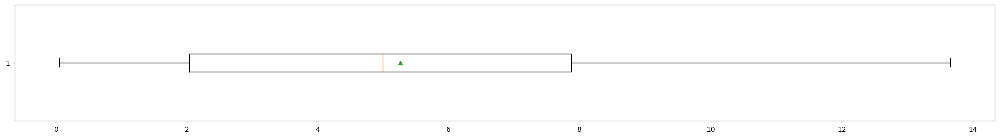

In [573]:
plt.figure(figsize=(25, 3))
plt.boxplot(gapminder_no_outliers_df["alcconsumption"], showmeans=True, vert=False)
plt.show()

Analisis Univariado breastcancerper100th

In [574]:
gapminder_no_outliers_df["breastcancerper100th"].describe(percentiles=[.25, .5, .75, .95, .99])

count    128.000000
mean      31.864844
std       19.343491
min        3.900000
25%       19.400000
50%       26.050000
75%       36.750000
95%       75.505000
99%       91.900000
max       92.000000
Name: breastcancerper100th, dtype: float64

In [575]:
gapminder_no_outliers_df = gapminder_no_outliers_df.loc[gapminder_no_outliers_df["breastcancerper100th"] <= gapminder_no_outliers_df["breastcancerper100th"].quantile(.9)]

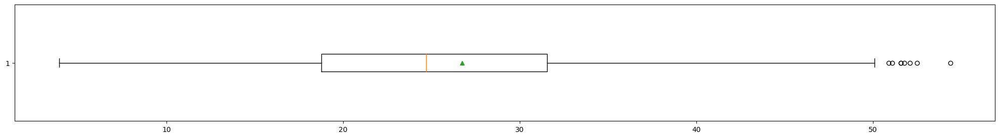

In [576]:
plt.figure(figsize=(25, 3))
plt.boxplot(gapminder_no_outliers_df["breastcancerper100th"], showmeans=True, vert=False)
plt.show()

Analisis Univariado lifeexpectancy

In [577]:
gapminder_no_outliers_df["lifeexpectancy"].describe(percentiles=[.25, .5, .75, .95, .99])

count    115.000000
mean      66.216157
std        9.333342
min       48.132000
25%       58.068000
50%       68.795000
75%       73.824000
95%       77.269300
99%       79.830440
max       81.404000
Name: lifeexpectancy, dtype: float64

In [578]:
gapminder_no_outliers_df = gapminder_no_outliers_df.loc[gapminder_no_outliers_df["lifeexpectancy"] <= gapminder_no_outliers_df["lifeexpectancy"].quantile(.9)]

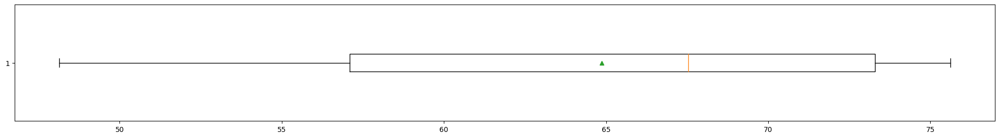

In [579]:
plt.figure(figsize=(25, 3))
plt.boxplot(gapminder_no_outliers_df["lifeexpectancy"], showmeans=True, vert=False)
plt.show()

Analisis Univariado internetuserate

In [580]:
gapminder_no_outliers_df["internetuserate"].describe(percentiles=[.25, .5, .75, .95, .99])

count    103.000000
mean      18.957720
std       17.595297
min        0.720009
25%        5.239043
50%       12.334893
75%       29.939930
95%       51.622829
99%       71.324177
max       79.889777
Name: internetuserate, dtype: float64

In [581]:
gapminder_no_outliers_df = gapminder_no_outliers_df.loc[gapminder_df["internetuserate"] <= gapminder_no_outliers_df["internetuserate"].quantile(.9)]

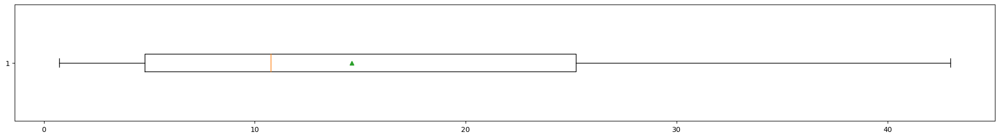

In [582]:
plt.figure(figsize=(25, 3))
plt.boxplot(gapminder_no_outliers_df["internetuserate"], showmeans=True, vert=False)
plt.show()

Analisis Univariado urbanrate

In [583]:
gapminder_no_outliers_df["urbanrate"].describe(percentiles=[.25, .5, .75, .95, .99])

count    92.000000
mean     46.134565
std      20.598188
min      10.400000
25%      29.535000
50%      42.600000
75%      60.400000
95%      84.303000
99%      87.841800
max      93.320000
Name: urbanrate, dtype: float64

In [584]:
gapminder_no_outliers_df = gapminder_no_outliers_df.loc[gapminder_no_outliers_df["urbanrate"] <= gapminder_no_outliers_df["urbanrate"].quantile(.9)]

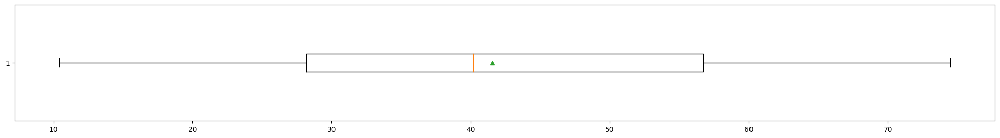

In [585]:
plt.figure(figsize=(25, 3))
plt.boxplot(gapminder_no_outliers_df["urbanrate"], showmeans=True, vert=False)
plt.show()

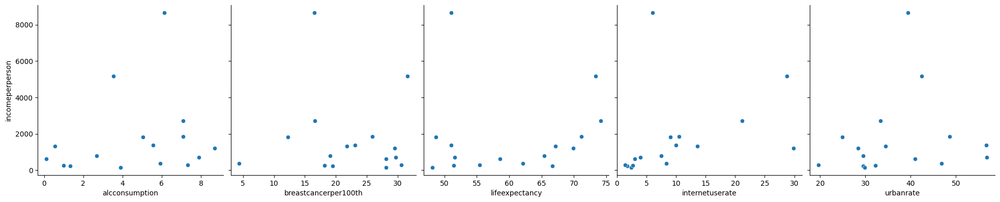

In [586]:
sns.pairplot(gapminder_no_outliers_df.sample(frac=0.2), height=4, y_vars="incomeperperson", x_vars=features_top5, kind="scatter")

Búsqueda de relaciones entre las variables de entrada

<Axes: >

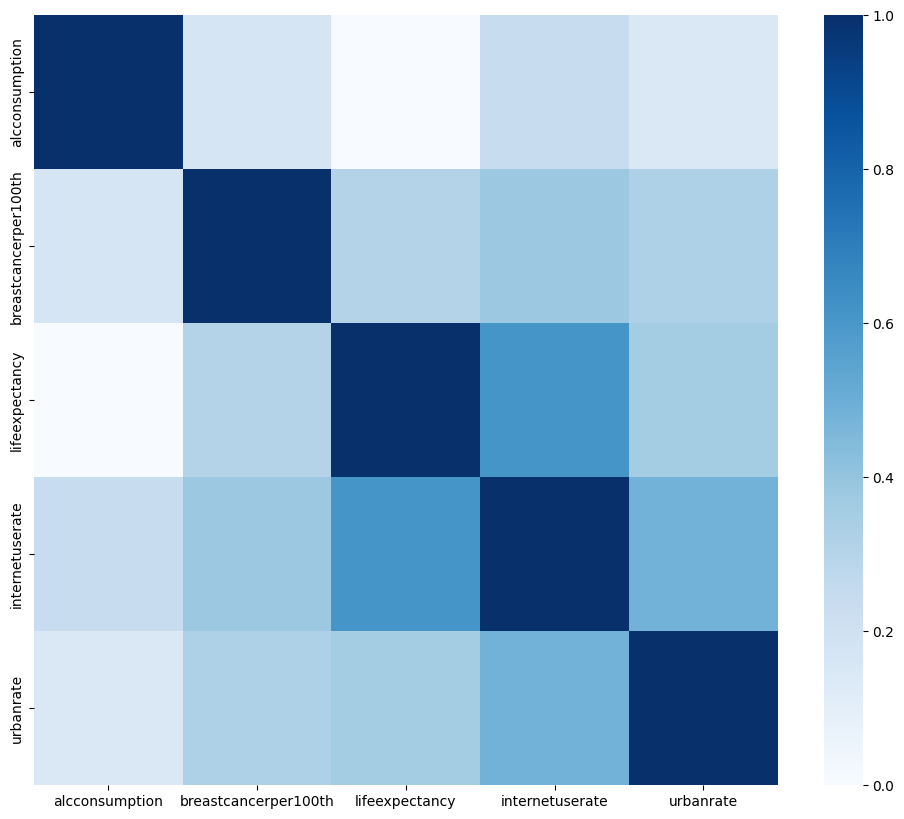

In [587]:
plt.figure(figsize=(12, 10))
sns.heatmap(gapminder_no_outliers_df[features_top5].corr(), cmap="Blues", vmin=0, vmax=1)

## Particionamiento del conjunto de datos en entrenamiento y prueba

Se desea construir un modelo que se ajuste bien a los datos de entrenamiento, pero que además se comporte de forma similar con datos previamente desconocidos.

Metodológicamente, una práctica común para validar esto es separando el conjunto de datos etiquetado en dos partes: entrenamiento y prueba. La proporción reservada para probar el modelo es definida por el analista, pero un valor común es 30%.

In [588]:
X_train, X_test, y_train, y_test = train_test_split(gapminder_no_outliers_df[features_top5], gapminder_no_outliers_df["incomeperperson"], test_size=0.3, random_state=1)

In [589]:
X_train.shape, y_train.shape

((57, 5), (57,))

In [590]:
X_test.shape, y_test.shape

((25, 5), (25,))

In [591]:
gapminder_no_outliers_df.shape

(82, 16)

Entrenamiento de un primer modelo

In [592]:
regression = LinearRegression()

In [593]:
regression.fit(X_train, y_train)

LinearRegression()

In [594]:
pd.DataFrame({"columns": features_top5, "coef": regression.coef_})

,columns,coef
0,alcconsumption,95.263367
1,breastcancerper100th,7.561904
2,lifeexpectancy,-18.946305
3,internetuserate,55.268661
4,urbanrate,20.946258


In [595]:
regression.intercept_

481.8809341416393

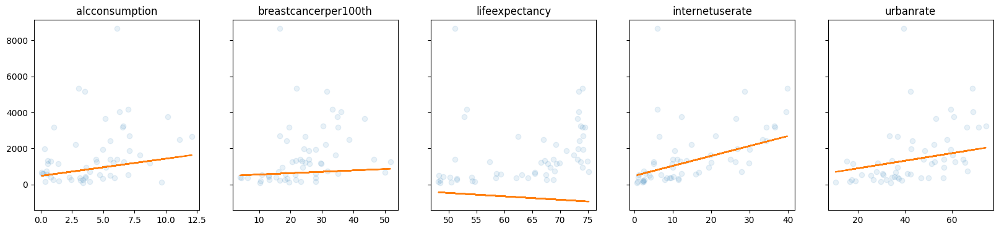

In [596]:
f, axs = plt.subplots(1, len(features_top5), sharey=True, figsize=(20, 4))

for i in range(len(features_top5)):
    col = features_top5[i]
    x = X_train[col]
    m = regression.coef_[i]
    b = regression.intercept_

    axs[i].plot(x, y_train, "o", alpha=0.1)
    axs[i].plot(x, x * m + b)
    axs[i].set_title(col)

In [597]:
print("Train:", mean_absolute_error(y_train, regression.predict(X_train)))
print("Test:", mean_absolute_error(y_test, regression.predict(X_test)))

Train: 831.6684188120166
Test: 797.4789264793185


In [598]:
print("Train:", np.sqrt(mean_squared_error(y_train, regression.predict(X_train))))
print("Test:", np.sqrt(mean_squared_error(y_test, regression.predict(X_test))))

Train: 1327.2574923707464
Test: 1001.9021837460507


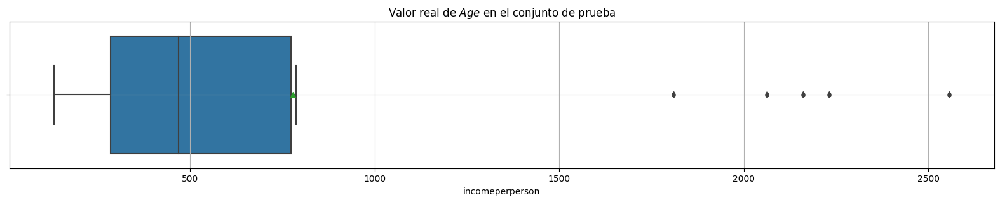

In [599]:
plt.figure(figsize=(20, 3))
sns.boxplot(x=y_test, showmeans=True, orient="h")
plt.title("Valor real de $\t{Age}$ en el conjunto de prueba")
plt.grid()
plt.show()

In [600]:
y_test.describe(percentiles=[0.25, 0.5, 0.75, 0.99])

count      25.000000
mean      778.870560
std       739.205538
min       131.796207
25%       285.224449
50%       468.696044
75%       772.933345
99%      2479.327965
max      2557.433638
Name: incomeperperson, dtype: float64

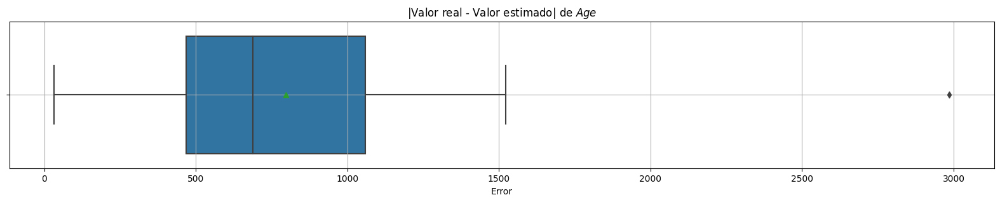

In [601]:
plt.figure(figsize=(20, 3))
sns.boxplot(x=abs(y_test - regression.predict(X_test)), showmeans=True, orient="h")
plt.title("|Valor real - Valor estimado| de $\t{Age}$")
plt.xlabel("Error")
plt.grid()
plt.show()

In [602]:
abs(y_test-regression.predict(X_test)).describe(percentiles=[0.25, 0.5, 0.75, 0.95, 0.99])

count      25.000000
mean      797.478926
std       619.000663
min        32.707941
25%       467.717958
50%       688.015866
75%      1059.815884
95%      1493.124798
99%      2635.037747
max      2986.298415
Name: incomeperperson, dtype: float64

In [604]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import PolynomialFeatures
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

import scipy.stats as stats

In [611]:
pipeline = Pipeline(
    [
        ("scaler", StandardScaler()),
        ("model", LinearRegression())
    ]
)

In [612]:
pipeline.fit(X_train, y_train)

Pipeline(steps=[('scaler', StandardScaler()), ('model', LinearRegression())])

In [614]:
pd.DataFrame({"columns": features_top5, "coef": pipeline["model"].coef_})

,columns,coef
0,alcconsumption,280.164961
1,breastcancerper100th,78.565591
2,lifeexpectancy,-174.476879
3,internetuserate,638.371587
4,urbanrate,340.773215


In [615]:
pipeline["model"].intercept_

1582.774038710526

In [616]:
y_train.mean(), y_test.mean()

(1582.7740387105262, 778.8705601199998)

In [617]:
print("MAE:")
print("Train:", mean_absolute_error(y_train, pipeline.predict(X_train)))
print("Test:", mean_absolute_error(y_test, pipeline.predict(X_test)))
print("\nRMSE:")
print("Train:", np.sqrt(mean_squared_error(y_train, pipeline.predict(X_train))))
print("Test:", np.sqrt(mean_squared_error(y_test, pipeline.predict(X_test))))

MAE:
Train: 831.6684188120165
Test: 797.4789264793184

RMSE:
Train: 1327.2574923707466
Test: 1001.9021837460505


## Supuestos

Colinealidad

<Axes: >

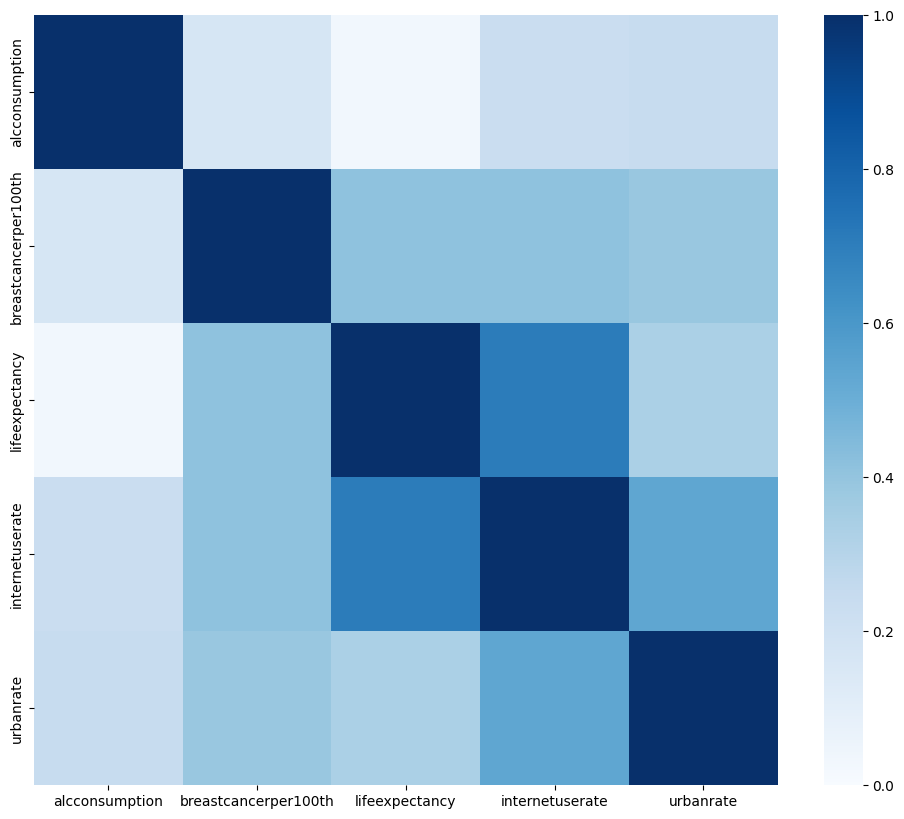

In [618]:
plt.figure(figsize=(12, 10))
sns.heatmap(X_train.corr(), cmap="Blues", vmin=0, vmax=1)

In [619]:
X_train.corr()

,alcconsumption,breastcancerper100th,lifeexpectancy,internetuserate,urbanrate
alcconsumption,1.000000,0.167439,0.032004,0.234041,0.243748
breastcancerper100th,0.167439,1.000000,0.413100,0.412528,0.387717
lifeexpectancy,0.032004,0.413100,1.000000,0.708144,0.335353
internetuserate,0.234041,0.412528,0.708144,1.000000,0.537952
urbanrate,0.243748,0.387717,0.335353,0.537952,1.000000


Linealidad

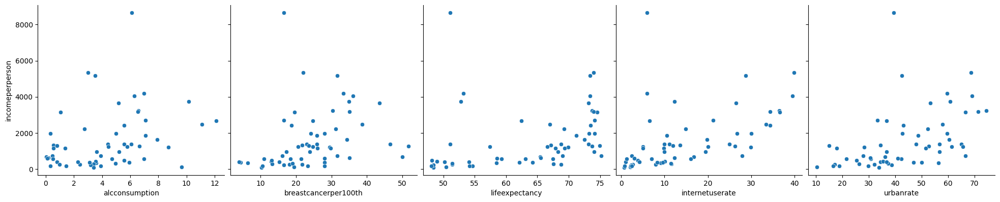

In [621]:
sns.pairplot(pd.concat([X_train, y_train], axis=1), height=4, y_vars="incomeperperson", x_vars=features_top5, kind="scatter")

In [631]:
pipeline = Pipeline(
    [
        ("poly", PolynomialFeatures(degree=4, include_bias=False)),
        ("scaler", StandardScaler()),
        ("model", LinearRegression())
    ]
)

In [632]:
pipeline.fit(X_train[features_top5], y_train)

Pipeline(steps=[('poly', PolynomialFeatures(degree=4, include_bias=False)),
                ('scaler', StandardScaler()), ('model', LinearRegression())])

In [633]:
pd.DataFrame({"columns": pipeline["poly"].get_feature_names_out(), "coef": pipeline["model"].coef_})

,columns,coef
0,alcconsumption,-34994.933760
1,breastcancerper100th,1376.316736
2,lifeexpectancy,14413.952184
3,internetuserate,11652.561322
4,urbanrate,16146.346468
...,...,...
120,internetuserate^4,7423.118450
121,internetuserate^3 urbanrate,15479.206934
122,internetuserate^2 urbanrate^2,-1928.442011
123,internetuserate urbanrate^3,2310.026650


In [634]:
print("MAE:")
print("Train:", mean_absolute_error(y_train, pipeline.predict(X_train[features_top5])))
print("Test:", mean_absolute_error(y_test, pipeline.predict(X_test[features_top5])))
print("\nRMSE:")
print("Train:", np.sqrt(mean_squared_error(y_train, pipeline.predict(X_train[features_top5]))))
print("Test:", np.sqrt(mean_squared_error(y_test, pipeline.predict(X_test[features_top5]))))

MAE:
Train: 1.2907669475169857e-10
Test: 4870.440474931726

RMSE:
Train: 1.7001682697171286e-10
Test: 9037.046946509074


In [635]:
pipeline = Pipeline(
    [
        ("scaler", StandardScaler()),
        ("model", LinearRegression())
    ]
)

In [637]:
pipeline.fit(X_train[features_top5], y_train)

Pipeline(steps=[('scaler', StandardScaler()), ('model', LinearRegression())])

In [639]:
errors = (pipeline.predict(X_train[features_top5])-y_train).values

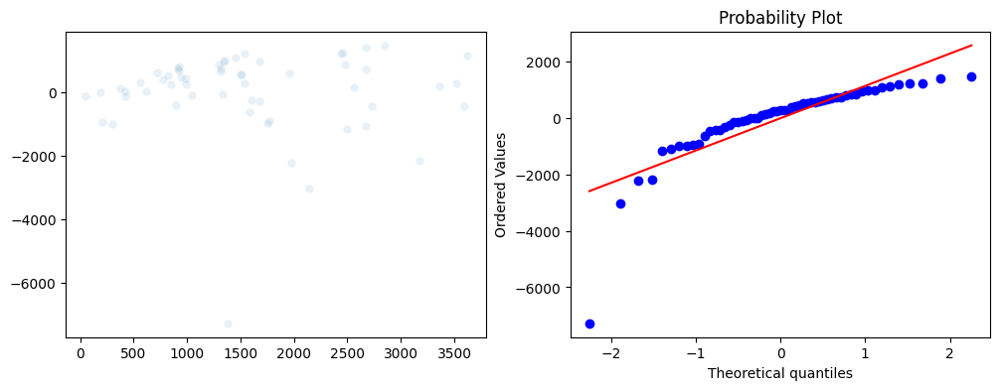

In [640]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4))

# Dispersión
sns.scatterplot(x=pipeline.predict(X_train[features_top5]), y=errors, alpha=0.1, ax=axes[0])

# q-q plot
_ = stats.probplot(errors, dist="norm", plot=axes[1])

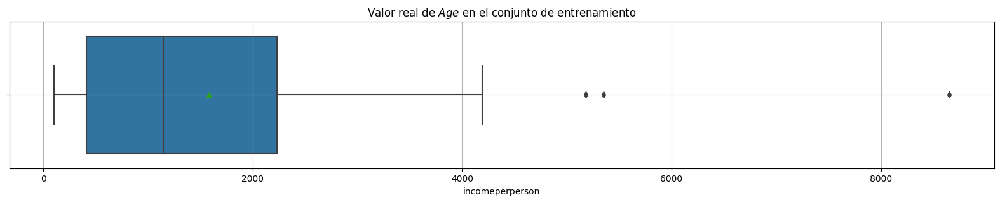

In [641]:
plt.figure(figsize=(20, 3))
sns.boxplot(x=y_train, showmeans=True, orient="h")
plt.title("Valor real de $\t{Age}$ en el conjunto de entrenamiento")
plt.grid()
plt.show()

In [642]:
q1 = y_train.quantile(0.25)
q3 = y_train.quantile(0.75)
iqr = q3-q1
threshold = q3+1.5*iqr
threshold

4959.438764050001

In [643]:
y_train = y_train.loc[y_train <= threshold]
X_train = X_train.loc[y_train.index]

In [644]:
y_test = y_test.loc[y_test <= threshold]
X_test = X_test.loc[y_test.index]

In [646]:
pipeline.fit(X_train[features_top5], y_train)

Pipeline(steps=[('scaler', StandardScaler()), ('model', LinearRegression())])

In [647]:
pd.DataFrame({"columns": features_top5, "coef": pipeline["model"].coef_})

,columns,coef
0,alcconsumption,279.070000
1,breastcancerper100th,172.697805
2,lifeexpectancy,60.980238
3,internetuserate,348.885433
4,urbanrate,339.002743


In [649]:
print("MAE:")
print("Train:", mean_absolute_error(y_train, pipeline.predict(X_train[features_top5])))
print("Test:", mean_absolute_error(y_test, pipeline.predict(X_test[features_top5])))
print("\nRMSE:")
print("Train:", np.sqrt(mean_squared_error(y_train, pipeline.predict(X_train[features_top5]))))
print("Test:", np.sqrt(mean_squared_error(y_test, pipeline.predict(X_test[features_top5]))))

MAE:
Train: 556.1943200965803
Test: 647.719486924741

RMSE:
Train: 722.520864010869
Test: 798.4006223082291


In [650]:
errors = (pipeline.predict(X_train[features_top5])-y_train).values

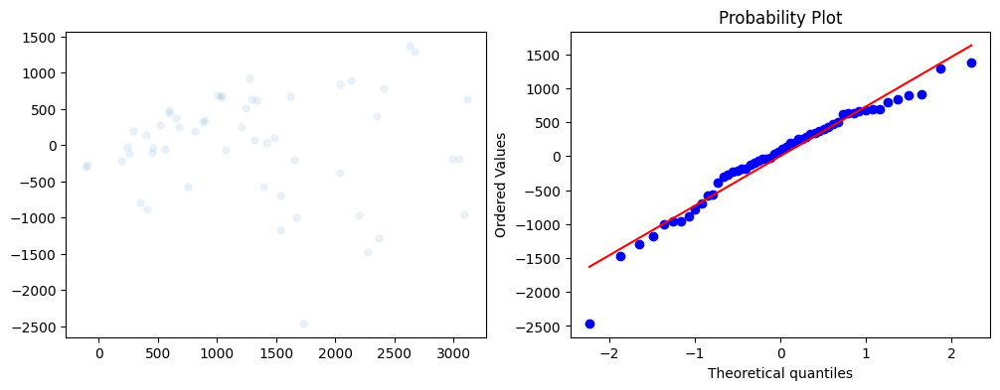

In [651]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4))

# Dispersión
sns.scatterplot(x=pipeline.predict(X_train[features_top5]), y=errors, alpha=0.1, ax=axes[0])

# q-q plot
_ = stats.probplot(errors, dist="norm", plot=axes[1])

Varianza constante (Homocedasticidad)

<Axes: >

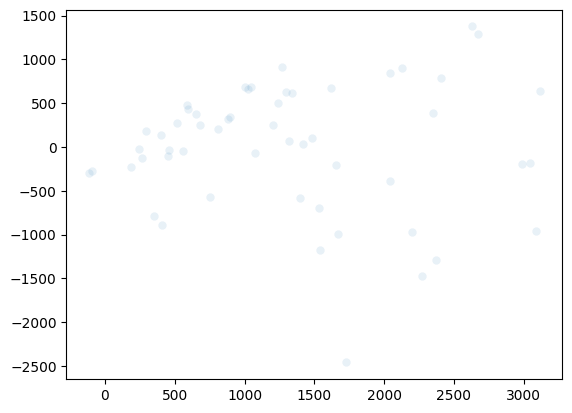

In [653]:
sns.scatterplot(x = pipeline.predict(X_train[features_top5]), y=errors, alpha=0.1)

Persistencia del modelo

## 2. Univariate analysis

# **Desarrollo de la estrategia**

# Analysis univariate for price

In [ ]:
incomeperperson, alcconsumption, breastcancerper100th, co2emissions, internetuserate

In [ ]:
gapminder_df["incomeperperson"].unique()

163

In [ ]:
gapminder_df["incomeperperson"].max()

52301.58718

In [ ]:
gapminder_df["incomeperperson"].min()

103.7758572

In [ ]:
# Calculating the relative frecuency
gapminder_df["incomeperperson"].value_counts(dropna=False, normalize=True)

NaN             0.016854
27595.091350    0.011236
52301.587180    0.011236
5184.709328     0.011236
279.180453      0.011236
                  ...   
27110.731590    0.005618
561.708585      0.005618
558.062877      0.005618
1200.652075     0.005618
37491.179520    0.005618
Name: incomeperperson, Length: 164, dtype: float64